# Flippy Illusions

Hi! Welcome to the official colab demo for our demo "Diffusion Illusions: Hiding Images in Plain Sight". [https://ryanndagreat.github.io/Diffusion-Illusions/](https://ryanndagreat.github.io/Diffusion-Illusions/)

This project was inspired by our paper "Peekaboo: Text to Image Diffusion Models are Zero-Shot Segmentors". The Peekaboo project website: [https://ryanndagreat.github.io/peekaboo/](https://ryanndagreat.github.io/peekaboo/)

Instructions:

0. Go to the Runtime menu, and make sure this notebook is using GPU!
1. Run the top 2 code cells (one cleans colab's junk and downloads the source code, while the other installs python packages)
2. Click 'Runtime', then 'Restart Runtime'. You need to do this the first time you open this notebook to avoid weird random errors from the pip installations.
3. Run code cells to load stable diffusion. The first time you run it it will take a few minutes to download; subsequent times won't take long at all though.
4. Run all the cells below that, and customize prompt_a and prompt_b!
5. Take the result top_image and bottom_image, print them out, and shine a backlight through them like shown in the Diffusion Illusion website (link above!)

I may also create a YouTube tutorial if there's interest. Let me know if this would be helpful!

This notebook was written by Ryan Burgert. Feel free to reach out to me at rburgert@cs.stonybrook.edu if you have any questions!

在Ryan等人的成果上增加了可以进行顺逆时针90度旋转的版本，而不只局限于180度旋转

In [ ]:
%%bash
if [ ! -d ".git" ]; then
    rm -rf * .*; #Get rid of Colab's default junk files
    git clone -b master https://github.com/floatup/Diffusion-Illusions .
fi

rm: refusing to remove '.' or '..' directory: skipping '.'
rm: refusing to remove '.' or '..' directory: skipping '..'
Cloning into '.'...


In [ ]:
%pip install --upgrade -r requirements.txt
%pip install rp --upgrade
# You may need to restart the runtime after installing these
# I'm not sure why this helps, but all sorts of weird random errors pop up in Colab if you don't

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.2/35.2 MB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 104.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.3/57.3 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 31.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Using cached oldest_supported_numpy-2023.12.21-py3-none-any.whl.metadata (9.8 kB)
  Using cached numpy-1.26.2-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 MB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 125.3/125.3 kB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import numpy as np
import rp
import torch
import torch.nn as nn
import source.stable_diffusion as sd
from easydict import EasyDict
from source.learnable_textures import LearnableImageFourier
from source.stable_diffusion_labels import NegativeLabel
from itertools import chain
import time

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


In [ ]:
#ONLY GOOD PROMPTS HERE
example_prompts = rp.load_yaml_file('source/example_prompts.yaml')
print('Available example prompts:', ', '.join(example_prompts))

#These prompts are all strings - you can replace them with whatever you want! By default it lets you choose from example prompts
#Here are some on the site! It does take some thought to come up with good ideas; the upside-down should look vaguely like the right-side up to work nicely
# prompt_a, prompt_b = rp.gather(example_prompts, 'victorial_dress victorial_dress'.split())
# prompt_a, prompt_b = rp.gather(example_prompts, 'pencil_giraffe_head pencil_penguin'.split())
# prompt_a, prompt_b = rp.gather(example_prompts, 'sailing_ship sailing_ship'.split())

prompt_a = "A penguin"
prompt_b = "A plane"

negative_prompt = ''

print()
print('Negative prompt:',repr(negative_prompt))
print()
print('Chosen prompts:')
print('    prompt_a =', repr(prompt_a)) #This will be right-side up
print('    prompt_b =', repr(prompt_b)) #This will be upside-down

Available example prompts: kitten_in_box, botw_landscape, magic_emma_watson, yorkshire_terrier_santa, norwegian_winter_girl, magic_forest_temple, sailing_ship, bioshock_lighthouse, two_bunnys_hugging, thomas_tank_military, wolf_on_rock, victorial_dress, lolita_dress_magical_elf, pencil_giraffe_head, pencil_penguin, pencil_violin, pencil_orca_whale, pencil_cow, pencil_walrus, pencil_cat_head, pencil_dog_head, ape_with_gun, human_skeleton, gold_coins, golf_ball_in_forest, bear_in_forest, elephant_in_circus, mickey_mouse, mushroom, mario, burger, darth_vader, gandalf, fantasy_city, green_elf_girl, pikachu, spring, fall, winter, summer, miku, pyramids, dinosaur, lipstick, picard, bull_wing, froggo, assasin_creed, moon, minecraft_zombie, pistol, disco_ball, volcano, porche, hawaii_beach, walter_white, dalek, tardis, tennant, weeping_angel

Negative prompt: ''

Chosen prompts:
    prompt_a = 'A penguin wearing sunglasses on a white background'
    prompt_b = 'A rooster wearing overalls'


# New Section

In [ ]:
if 's' not in dir():
    model_name="CompVis/stable-diffusion-v1-4"
    gpu='cuda:0'
    s=sd.StableDiffusion(gpu,model_name)
device=s.device

[INFO] sd.py: loading stable diffusion...please make sure you have run `huggingface-cli login`.


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 14 files:   0%|          | 0/14 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

[INFO] sd.py: loaded stable diffusion!


In [ ]:
label_a = NegativeLabel(prompt_a,negative_prompt)
label_b = NegativeLabel(prompt_b,negative_prompt)

In [ ]:
#Image Parametrization and Initialization (this section takes vram)

#Select Learnable Image Size (this has big VRAM implications!):
#Note: We use implicit neural representations for better image quality
#They're previously used in our paper "TRITON: Neural Neural Textures make Sim2Real Consistent" (see tritonpaper.github.io)
# ... and that representation is based on Fourier Feature Networks (see bmild.github.io/fourfeat)
learnable_image_maker = lambda: LearnableImageFourier(height=256, width=256, hidden_dim=256, num_features=128).to(s.device); SIZE=256
# learnable_image_maker = lambda: LearnableImageFourier(height=512,width=512,num_features=256,hidden_dim=256,scale=20).to(s.device);SIZE=512

image=learnable_image_maker()

In [ ]:
learnable_image_a=lambda: image() #Right-side up
learnable_image_b_90 = lambda: image().rot90(k=3, dims=[1, 2]) #90度顺时针
learnable_image_b_180=lambda: image().rot90(k=2,dims=[1,2]) #翻转
learnable_image_b_270 = lambda: image().rot90(k=1, dims=[1, 2]) #270度顺时针

learnable_image_b=learnable_image_b_90=lambda: image().rot90(k=2,dims=[1,2]) #在这里选择希望选择的度数

optim=torch.optim.SGD(image.parameters(),lr=1e-4)

In [ ]:
labels=[label_a,label_b]
learnable_images=[learnable_image_a,learnable_image_b]

#The weight coefficients for each prompt. For example, if we have [0,1], then only the upside-down mode will be optimized
weights=[1,1]

weights=rp.as_numpy_array(weights)
weights=weights/weights.sum()
weights=weights*len(weights)

In [ ]:
#For saving a timelapse
ims=[]

In [ ]:
def get_display_image():
    return rp.tiled_images(
        [
            rp.as_numpy_image(learnable_image_a()),
            rp.as_numpy_image(learnable_image_b()),
        ],
        length=len(learnable_images),
        border_thickness=0,
    )

Every 200 iterations we display an image in the form [image_a, image_b], where
    image_a = (the right-side up image)
    image_b = (image_a, but upside down)

Interrupt the kernel at any time to return the currently displayed image
You can run this cell again to resume training later on

Please expect this to take quite a while to get good images (especially on the slower Colab GPU's)! The longer you wait the better they'll be


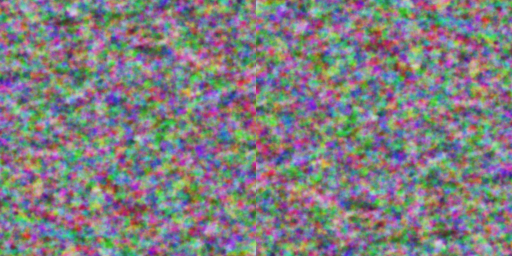

Status: ETR=3:07:16.444232      ETA=3:11:05.759420      T=0:03:49.315188        Progress: 200/10000     RATE=0.87/s

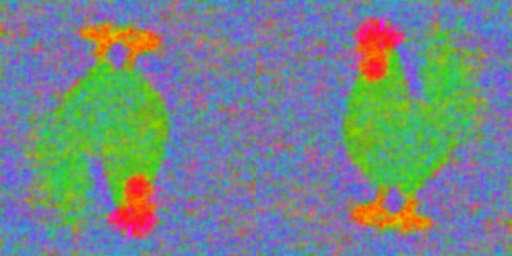

Status: ETR=3:07:03.576748      ETA=3:14:51.225779      T=0:07:47.649031        Progress: 400/10000     RATE=0.86/s

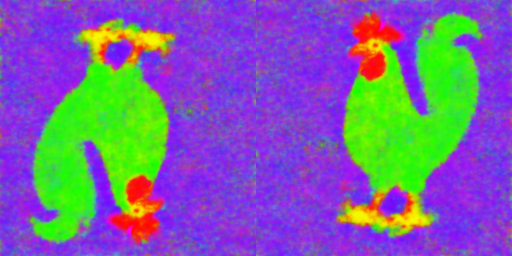

Status: ETR=3:04:35.970284      ETA=3:16:22.947111      T=0:11:46.976827        Progress: 600/10000     RATE=0.85/s

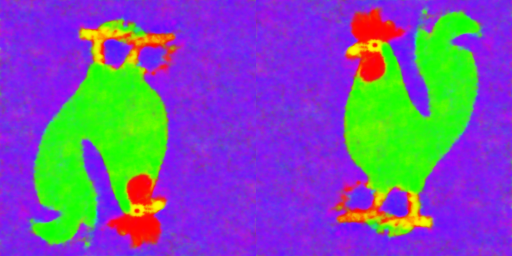

Status: ETR=3:01:46.690909      ETA=3:17:35.098814      T=0:15:48.407905        Progress: 800/10000     RATE=0.84/s

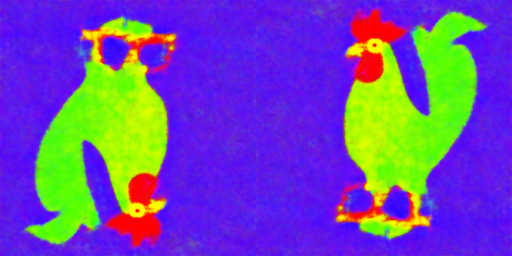

Status: ETR=2:58:41.162622      ETA=3:18:32.402914      T=0:19:51.240291        Progress: 1000/10000    RATE=0.84/s

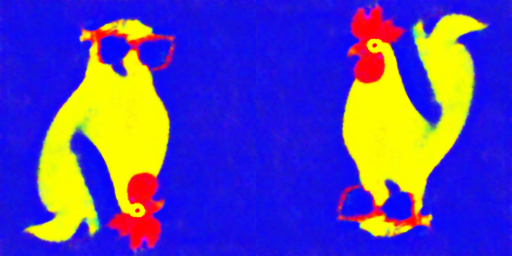

Status: ETR=2:55:16.135582      ETA=3:19:10.154070      T=0:23:54.018488        Progress: 1200/10000    RATE=0.84/s

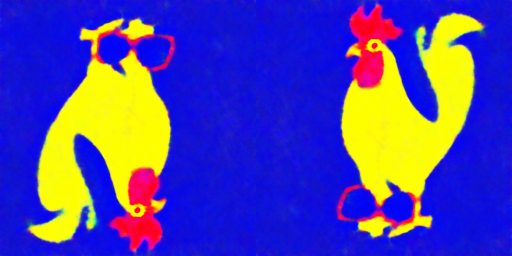

Status: ETR=2:51:40.374314      ETA=3:19:37.179435      T=0:27:56.805121        Progress: 1400/10000    RATE=0.83/s

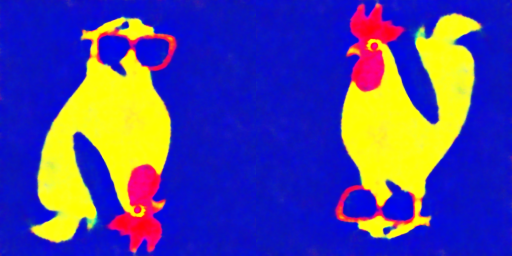

Status: ETR=2:47:57.955769      ETA=3:19:57.566392      T=0:31:59.610623        Progress: 1600/10000    RATE=0.83/s

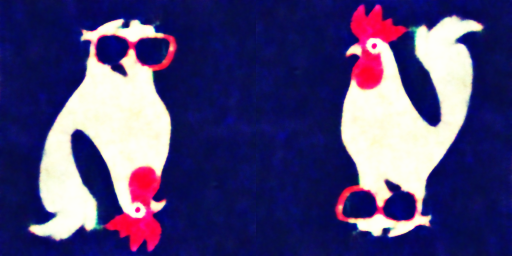

Status: ETR=2:44:10.873646      ETA=3:20:13.260543      T=0:36:02.386898        Progress: 1800/10000    RATE=0.83/s

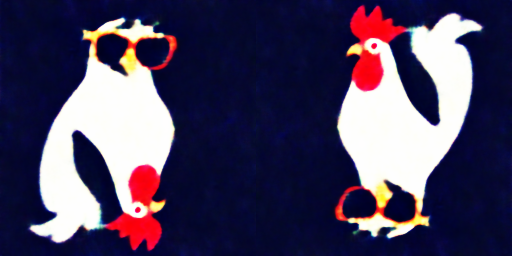

Status: ETR=2:40:20.315461      ETA=3:20:25.394326      T=0:40:05.078865        Progress: 2000/10000    RATE=0.83/s

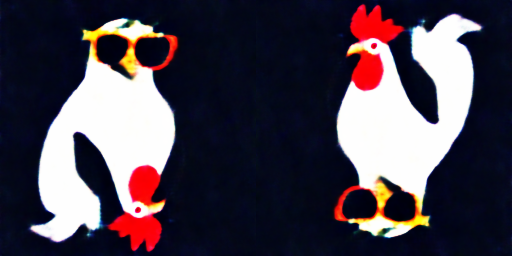

Status: ETR=2:36:27.714353      ETA=3:20:35.531222      T=0:44:07.816869        Progress: 2200/10000    RATE=0.83/s

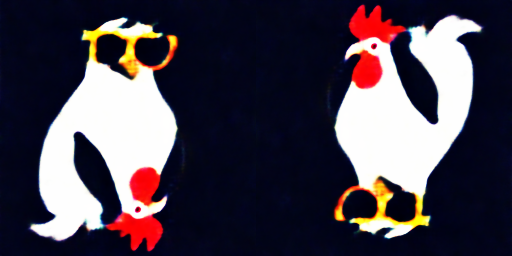

Status: ETR=2:32:33.453021      ETA=3:20:44.017133      T=0:48:10.564112        Progress: 2400/10000    RATE=0.83/s

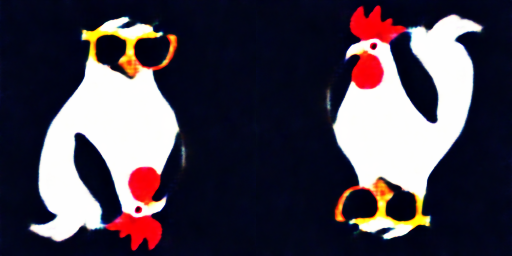

Status: ETR=2:28:37.023537      ETA=3:20:50.031807      T=0:52:13.008270        Progress: 2600/10000    RATE=0.83/s

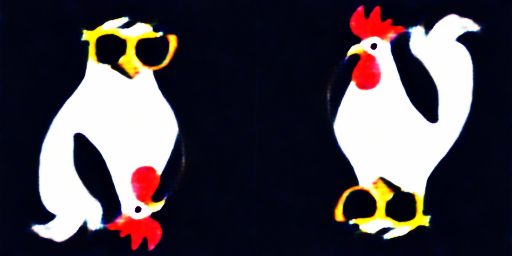

Status: ETR=2:24:40.494250      ETA=3:20:56.242014      T=0:56:15.747764        Progress: 2800/10000    RATE=0.83/s

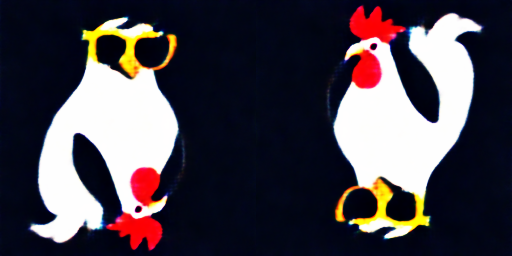

Status: ETR=2:20:43.430545      ETA=3:21:02.043636      T=1:00:18.613091        Progress: 3000/10000    RATE=0.83/s

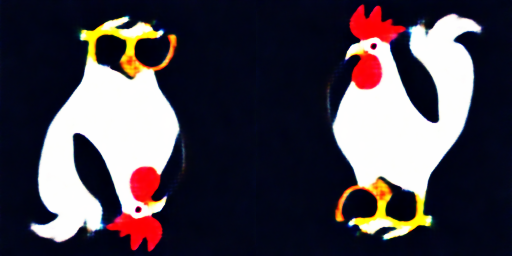

Status: ETR=2:16:45.495780      ETA=3:21:06.905559      T=1:04:21.409779        Progress: 3200/10000    RATE=0.83/s

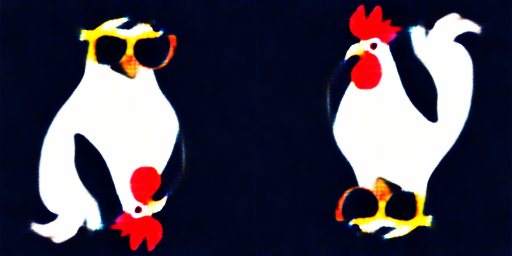

Status: ETR=2:12:47.069684      ETA=3:21:11.317703      T=1:08:24.248019        Progress: 3400/10000    RATE=0.83/s

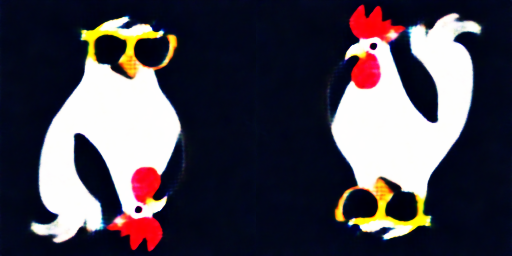

Status: ETR=2:08:48.053246      ETA=3:21:15.083196      T=1:12:27.029951        Progress: 3600/10000    RATE=0.83/s

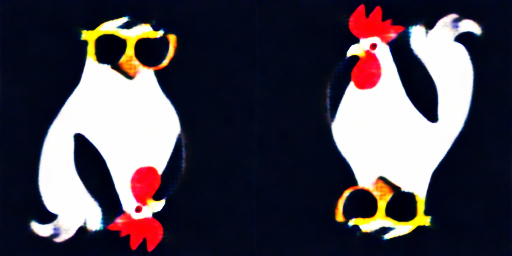

Status: ETR=2:04:48.683908      ETA=3:21:18.522432      T=1:16:29.838524        Progress: 3800/10000    RATE=0.83/s

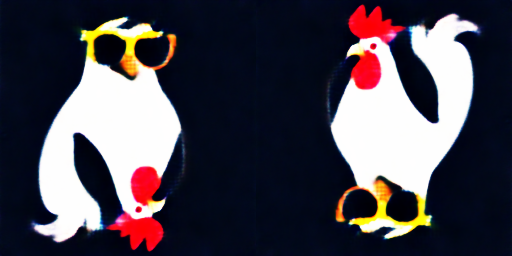

Status: ETR=2:00:49.002632      ETA=3:21:21.671053      T=1:20:32.668421        Progress: 4000/10000    RATE=0.83/s

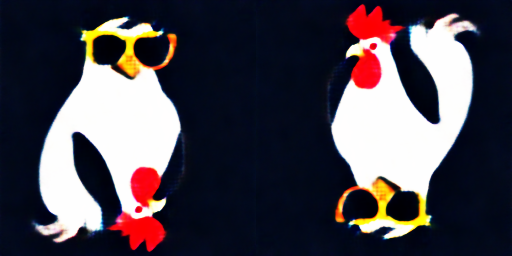

Status: ETR=1:56:48.962744      ETA=3:21:24.418523      T=1:24:35.455780        Progress: 4200/10000    RATE=0.83/s

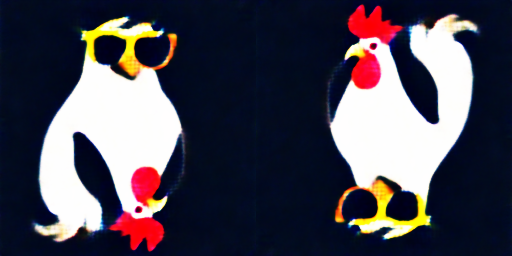

Status: ETR=1:52:48.756003      ETA=3:21:27.064292      T=1:28:38.308288        Progress: 4400/10000    RATE=0.83/s

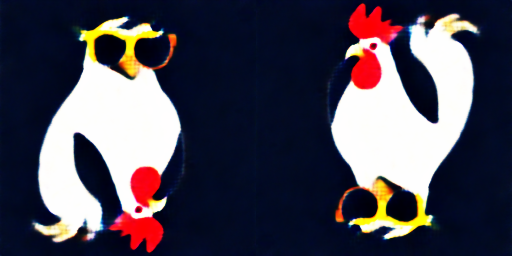

Status: ETR=1:48:48.290249      ETA=3:21:29.426387      T=1:32:41.136138        Progress: 4600/10000    RATE=0.83/s

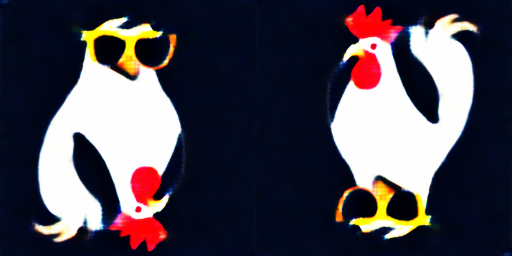

Status: ETR=1:44:47.640583      ETA=3:21:31.616505      T=1:36:43.975922        Progress: 4800/10000    RATE=0.83/s

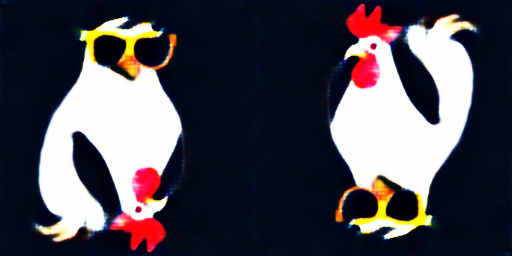

Status: ETR=1:40:46.810169      ETA=3:21:33.620337      T=1:40:46.810169        Progress: 5000/10000    RATE=0.83/s

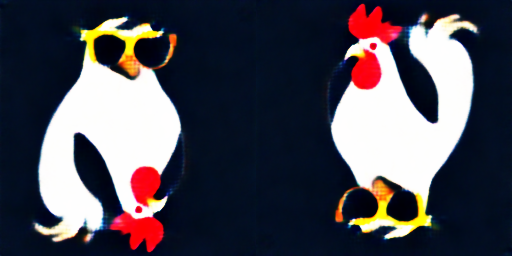

Status: ETR=1:36:45.833086      ETA=3:21:35.485596      T=1:44:49.652510        Progress: 5200/10000    RATE=0.83/s

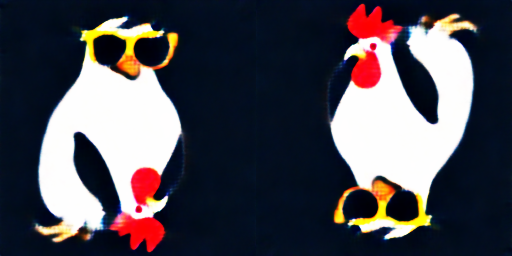

Status: ETR=1:32:44.687937      ETA=3:21:37.147688      T=1:48:52.459752        Progress: 5400/10000    RATE=0.83/s

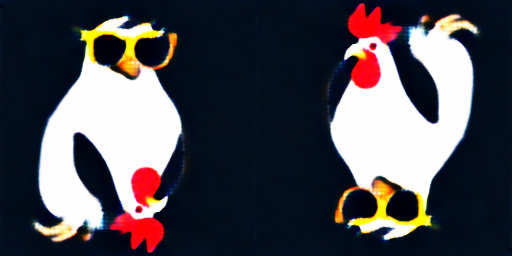

Status: ETR=1:28:43.427046      ETA=3:21:38.697831      T=1:52:55.270786        Progress: 5600/10000    RATE=0.83/s

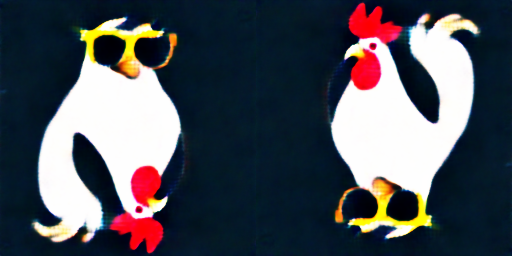

Status: ETR=1:24:42.059294      ETA=3:21:40.141175      T=1:56:58.081882        Progress: 5800/10000    RATE=0.83/s

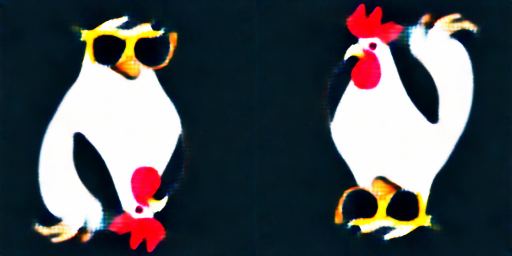

Status: ETR=1:20:40.606216      ETA=3:21:41.515539      T=2:01:00.909323        Progress: 6000/10000    RATE=0.83/s

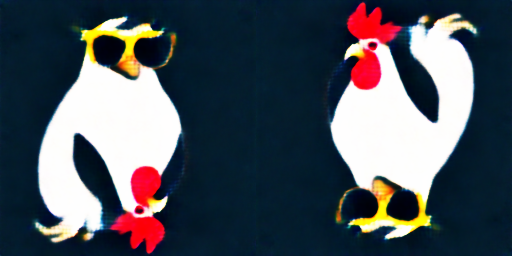

Status: ETR=1:16:39.138162      ETA=3:21:42.995162      T=2:05:03.857001        Progress: 6200/10000    RATE=0.83/s

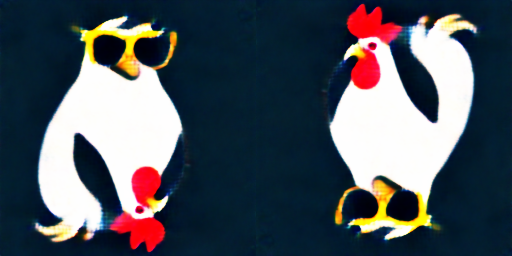

Status: ETR=1:12:37.509035      ETA=3:21:44.191765      T=2:09:06.682729        Progress: 6400/10000    RATE=0.83/s

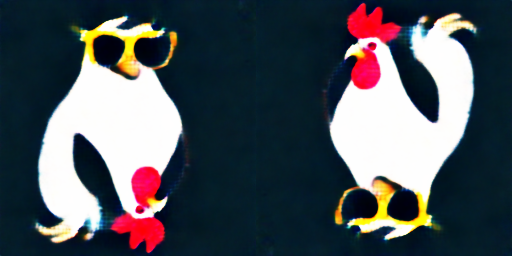

Status: ETR=1:08:35.831145      ETA=3:21:45.385722      T=2:13:09.554576        Progress: 6600/10000    RATE=0.83/s

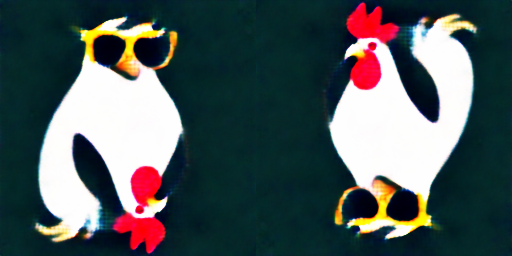

Status: ETR=1:04:34.050469      ETA=3:21:46.407716      T=2:17:12.357247        Progress: 6800/10000    RATE=0.83/s

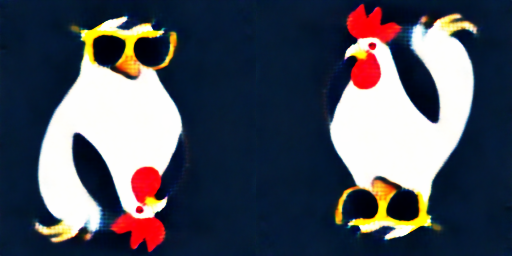

Status: ETR=1:00:32.217944      ETA=3:21:47.393147      T=2:21:15.175203        Progress: 7000/10000    RATE=0.83/s

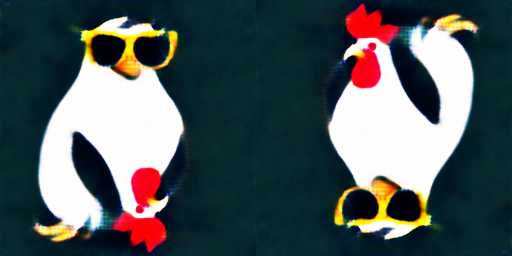

Status: ETR=0:56:30.317611      ETA=3:21:48.277182      T=2:25:17.959571        Progress: 7200/10000    RATE=0.83/s

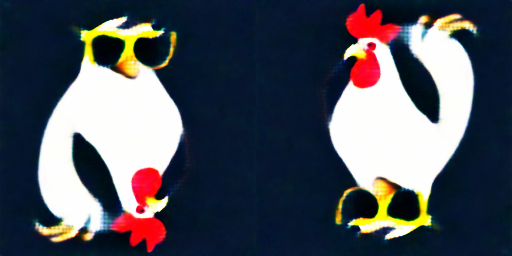

Status: ETR=0:52:28.387082      ETA=3:21:49.181086      T=2:29:20.794004        Progress: 7400/10000    RATE=0.83/s

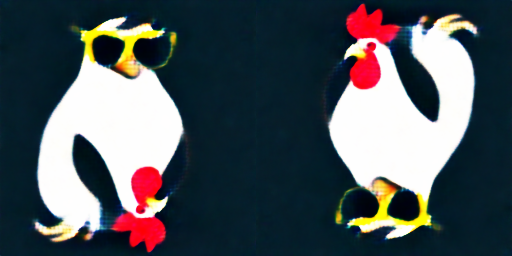

Status: ETR=0:48:26.401635      ETA=3:21:50.006812      T=2:33:23.605177        Progress: 7600/10000    RATE=0.83/s

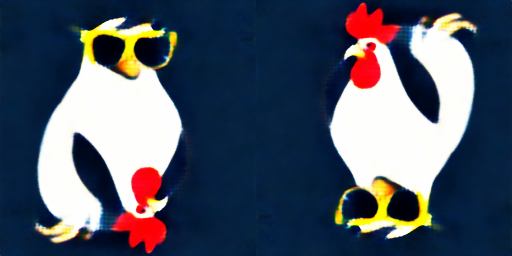

Status: ETR=0:44:24.382013      ETA=3:21:50.827331      T=2:37:26.445318        Progress: 7800/10000    RATE=0.83/s

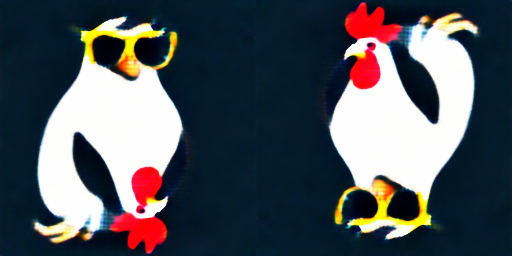

Status: ETR=0:40:22.318215      ETA=3:21:51.591073      T=2:41:29.272859        Progress: 8000/10000    RATE=0.83/s

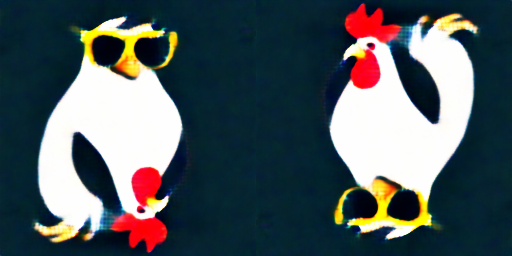

Status: ETR=0:36:20.208047      ETA=3:21:52.266929      T=2:45:32.058882        Progress: 8200/10000    RATE=0.83/s

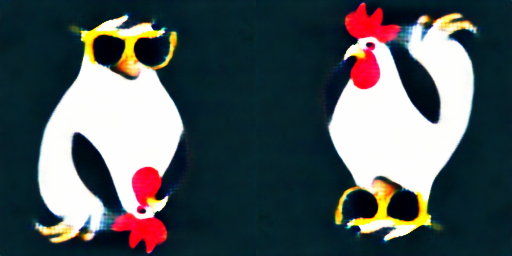

Status: ETR=0:32:18.073080      ETA=3:21:52.956748      T=2:49:34.883669        Progress: 8400/10000    RATE=0.83/s

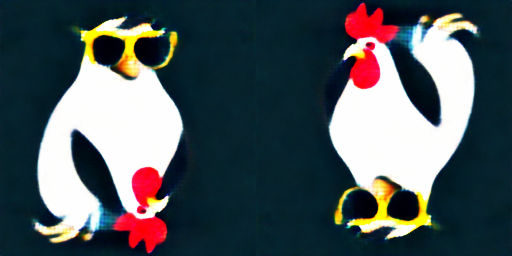

Status: ETR=0:28:15.904620      ETA=3:21:53.604429      T=2:53:37.699809        Progress: 8600/10000    RATE=0.83/s

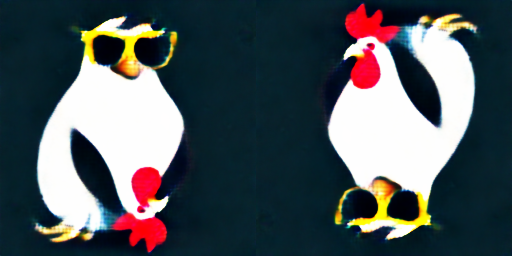

Status: ETR=0:24:13.707236      ETA=3:21:54.226965      T=2:57:40.519729        Progress: 8800/10000    RATE=0.83/s

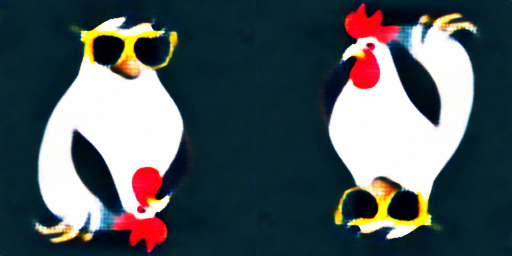

Status: ETR=0:20:11.482067      ETA=3:21:54.820666      T=3:01:43.338599        Progress: 9000/10000    RATE=0.83/s

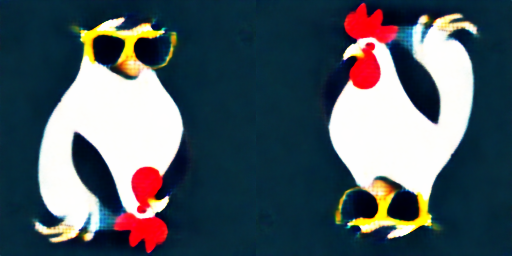

Status: ETR=0:16:09.230290      ETA=3:21:55.378619      T=3:05:46.148329        Progress: 9200/10000    RATE=0.83/s

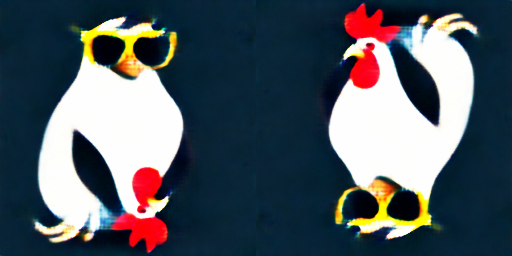

Status: ETR=0:12:06.950764      ETA=3:21:55.846075      T=3:09:48.895310        Progress: 9400/10000    RATE=0.83/s

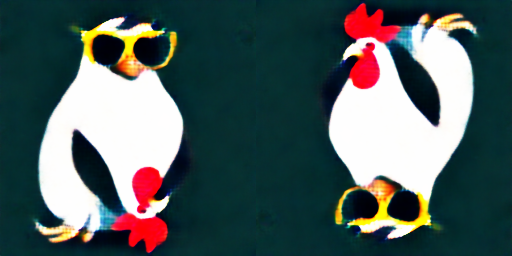

Status: ETR=0:08:04.653594      ETA=3:21:56.339862      T=3:13:51.686267        Progress: 9600/10000    RATE=0.83/s

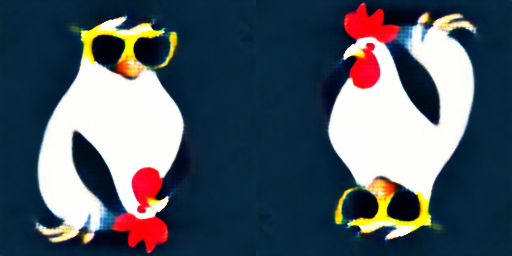

Status: ETR=0:04:02.335391      ETA=3:21:56.769568      T=3:17:54.434176        Progress: 9800/10000    RATE=0.83/s

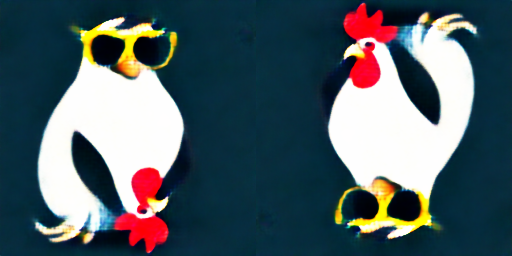

Status: ETR=0:00:01.211724      ETA=3:21:57.238007      T=3:21:56.026283        Progress: 9999/10000    RATE=0.83/s

In [ ]:
NUM_ITER=10000

#Set the minimum and maximum noise timesteps for the dream loss (aka score distillation loss)
s.max_step=MAX_STEP=990
s.min_step=MIN_STEP=10

display_eta=rp.eta(NUM_ITER, title='Status')

DISPLAY_INTERVAL = 200

print('Every %i iterations we display an image in the form [image_a, image_b], where'%DISPLAY_INTERVAL)
print('    image_a = (the right-side up image)')
print('    image_b = (image_a, but upside down)')
print()
print('Interrupt the kernel at any time to return the currently displayed image')
print('You can run this cell again to resume training later on')
print()
print('Please expect this to take quite a while to get good images (especially on the slower Colab GPU\'s)! The longer you wait the better they\'ll be')

try:
    for iter_num in range(NUM_ITER):
        display_eta(iter_num) #Print the remaining time

        preds=[]
        for label,learnable_image,weight in rp.random_batch(list(zip(labels,learnable_images,weights)), batch_size=1):
            pred=s.train_step(
                label.embedding,
                learnable_image()[None],

                #PRESETS (uncomment one):
                noise_coef=.1*weight,guidance_scale=60,#10
                # noise_coef=0,image_coef=-.01,guidance_scale=50,
                # noise_coef=0,image_coef=-.005,guidance_scale=50,
                # noise_coef=.1,image_coef=-.010,guidance_scale=50,
                # noise_coef=.1,image_coef=-.005,guidance_scale=50,
                # noise_coef=.1*weight, image_coef=-.005*weight, guidance_scale=50,
            )
            preds+=list(pred)

        with torch.no_grad():
            if iter_num and not iter_num%(DISPLAY_INTERVAL*50):
                #Wipe the slate every 50 displays so they don't get cut off
                from IPython.display import clear_output
                clear_output()

            if not iter_num%DISPLAY_INTERVAL:
                im = get_display_image()
                ims.append(im)
                rp.display_image(im)

        optim.step()
        optim.zero_grad()
except KeyboardInterrupt:
    print()
    print('Interrupted early at iteration %i'%iter_num)
    im = get_display_image()
    ims.append(im)
    rp.display_image(im)

Right-side up image:


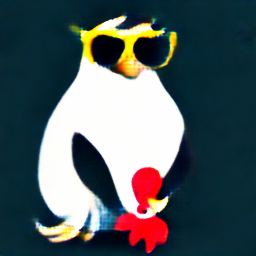

Upside-down image:


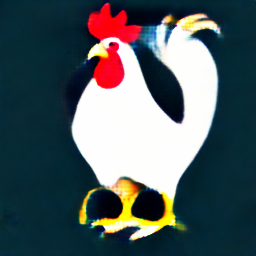

In [ ]:
print('Right-side up image:')
rp.display_image(rp.as_numpy_image(learnable_image_a()))

print('Upside-down image:')
rp.display_image(rp.as_numpy_image(learnable_image_b()))

In [ ]:
def save_run(name):
    folder="untracked/flippy_illusion_runs/%s"%name
    if rp.path_exists(folder):
        folder+='_%i'%time.time()
    rp.make_directory(folder)
    ims_names=['ims_%04i.png'%i for i in range(len(ims))]
    with rp.SetCurrentDirectoryTemporarily(folder):
        rp.save_images(ims,ims_names,show_progress=True)
    print()
    print('Saved timelapse to folder:',repr(folder))

save_run('-'.join([prompt_a,prompt_b])) #You can give it a good custom name if you want!

Saving Images: Done! Did 50 items in 0:00:02.095366
rp.save_images: Done! Saved 50 images in 2.106 seconds

Saved timelapse to folder: 'untracked/flippy_illusion_runs/A penguin wearing sunglasses on a white background-A rooster wearing overalls'
